In [1]:
import math
import os, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import datetime as dt
import random

cwd = os.getcwd()
project_path = cwd[:cwd.find('pygents')+7]
if project_path not in sys.path: sys.path.append(project_path)
os.chdir(project_path)

if 'aigents_api' in sys.modules:
    del sys.modules['aigents_api']
if 'learn' in sys.modules:
    del sys.modules['learn']
if 'util' in sys.modules:
    del sys.modules['util']

from pygents.learn import count_ngrams_plus, count_ngrams_plus_tf_idf
from pygents.aigents_api import TextMetrics
from pygents.plot import plot_dict
from pygents.util import dictcount

model_family = 'multiclass_view_cleaned'
if not os.path.exists('data/models/distortions/multiclass_task/overfitting_babacan_multiclass/'+model_family+'/'):
    os.makedirs('data/models/distortions/multiclass_task/overfitting_babacan_multiclass/'+model_family+'/')

grand_t0 = dt.datetime.now()

def language_metrics(metrics_list):
    metrics = {}
    for m in metrics_list:
        metrics[m] = 'data/models/distortions/multiclass_task/overfitting_babacan_multiclass/'+model_family+'/' + m + '.txt'
    return metrics


In [ ]:
from datasets import load_dataset

# dataset: https://huggingface.co/datasets/halilbabacan/combined_synthetic_cognitive_distortions/tree/main
ds = load_dataset(
    "halilbabacan/combined_synthetic_cognitive_distortions",
    split="train",
)

df = ds.to_pandas()
df = df.rename(columns={'text': 'Patient Question', 'label': 'Dominant Distortion'})
df.insert(1, 'Distorted part', value = np.nan)
df.insert(3, 'Secondary Distortion (Optional)', value = np.nan)
# Remove the row with index 738 because it contains a NaN in the text column
df = df.drop(index=738)


mapping = {
    "Labelling":            "Labeling",
    "Mental Filter":        "Mental filter",
    "Should Statements":    "Should statements",
    "All-or-Nothing Thinking": "All-or-nothing thinking"
}

df['Dominant Distortion'] = df['Dominant Distortion'].map(mapping).fillna(df['Dominant Distortion'])

df

,Patient Question,Distorted part,Dominant Distortion,Secondary Distortion (Optional)
0,John walked past me without saying a word He m...,NaN,Mind Reading,NaN
1,"During the meeting, Sarah didn't look at me on...",NaN,Mind Reading,NaN
2,Mike didn't respond to my text right away He m...,NaN,Mind Reading,NaN
3,Jessica didn't smile when she saw me She must ...,NaN,Mind Reading,NaN
4,Tom didn't invite me to his party He must not ...,NaN,Mind Reading,NaN
...,...,...,...,...
4526,I’m a 21 year old female. I spent most of my l...,NaN,No Distortion,NaN
4527,Now I am at university my peers around me all ...,NaN,Overgeneralization,NaN
4528,He claims he’s severely depressed and has outb...,NaN,Mental filter,NaN
4529,From the U.S.: I am a 21 year old woman who ha...,NaN,No Distortion,NaN


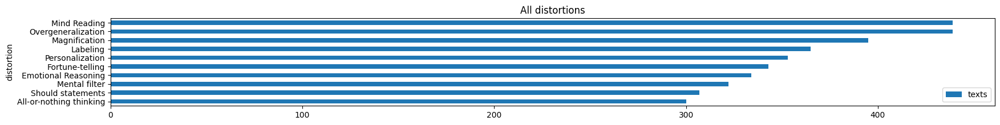

In [24]:
dists = {}
for _, row in df.iterrows():
        # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
        text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
        primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
        secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else 'No Distortion'  # The secondary distortion from the 4th column, if it exists
        ground_distortions = []
        if primary_distortion != 'No Distortion':
            ground_distortions.append(primary_distortion)
        if secondary_distortion != 'No Distortion':
            ground_distortions.append(secondary_distortion)
        for d in ground_distortions:
            dictcount(dists,d)
        
plot_dict(
    dists,
    labels="distortion",
    values="texts",
    title="All distortions",
    head=20
)

# Create learning functions
### Functions for including key N-grams and creating model files

In [3]:
def ngrams_inclusion(model_ngram, ngram_inclusion_threshold):
    filtered_model_ngram = {}
    for distortion, ngram_dict in model_ngram.items():
        # Find the maximum metric value for the current distortion
        max_value = max(ngram_dict.values()) if ngram_dict else 0
        threshold_value = max_value * (ngram_inclusion_threshold / 100)

        # Filter n-grams that meet or exceed the threshold value
        filtered_model_ngram[distortion] = {
            ngram: metric for ngram, metric in ngram_dict.items() if metric >= threshold_value
        }
    return filtered_model_ngram

def create_model_files(filtered_model_ngram):
    # Create .txt files for each distortion
    output_dir = "data/models/distortions/multiclass_task/overfitting_babacan_multiclass/"+model_family
    distortion_file_path = f"{output_dir}/Distortion.txt"
    distortions_labels = []

    with open(distortion_file_path, "w", encoding="utf-8") as distortion_file:
        for distortion, ngrams in filtered_model_ngram.items():
            distortion_ = distortion.replace(" ", "_")
            file_path = f"{output_dir}/{distortion_}.txt"
            sorted_ngrams = sorted(ngrams.items(), key=lambda x: x[1], reverse=True)
            distortions_labels.append(distortion_)
            with open(file_path, "w", encoding="utf-8") as f:
                for ngram, metric_value in sorted_ngrams:
                    ngram_str = ' '.join(ngram)
                    f.write(f"{ngram_str}\t{metric_value}\n")
                    if distortion != "No Distortion":
                            distortion_file.write(f"{ngram_str}\t{metric_value}\n")

    return (list(set(distortions_labels) - {'No_Distortion'}))

### Evaluate functions

In [4]:
all_metrics = ['All-or-nothing_thinking','Fortune-telling','Mental_filter','Overgeneralization','Labeling',
          'Mind_Reading','Personalization','Emotional_Reasoning','Magnification','Should_statements']

def our_evaluator_test(expected_distortions,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = True if (m in expected_distortions) else False
    return dic

def our_evaluator_tm(tm,text,threshold):
    metrics = tm.get_sentiment_words(text)
    dic = {}
    for m in all_metrics:
        dic[m] = True if m in metrics and metrics[m] > threshold else False
    return dic

def our_evaluator_true(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = True
    return dic
    
def our_evaluator_false(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = False
    return dic

def our_evaluator_random(tm,text,threshold):
    dic = {}
    for m in all_metrics:
        dic[m] = random.choice([True, False])
    return dic

def dictval(dic,key,val):
    return dic[key] if key in dic else val 

def pre_rec_f1_from_counts(true_positive, true_negative, false_positive, false_negative):
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    return precision, recall, 2 * precision * recall / (precision + recall) if precision > 0 or recall > 0 else 0 

def evaluate_tm_df(df,tm,evaluator,threshold,debug=False):
    true_positives = {}
    true_negatives = {}
    false_positives = {}
    false_negatives = {}
    pre = {}
    rec = {}
    f1 = {}
    acc = {}
    for _, row in df.iterrows():
        # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
        text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
        primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
        secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else 'No Distortion'  # The secondary distortion from the 4th column, if it exists
        ground_distortions = []
        if primary_distortion != 'No Distortion':
            ground_distortions.append(primary_distortion.replace(' ','_'))
        if secondary_distortion != 'No Distortion':
            ground_distortions.append(secondary_distortion.replace(' ','_'))

        if evaluator == our_evaluator_test:
            distortions_by_metric = evaluator(ground_distortions,text,threshold) #hack to test metrics
        else:
            distortions_by_metric = evaluator(tm,text,threshold)

        if debug:
            print(ground_distortions,'=>',[m for m in distortions_by_metric if distortions_by_metric[m]])
        
        for metric in distortions_by_metric:
            our_distortion = distortions_by_metric[metric]
            if (metric in ground_distortions) and our_distortion == True:
                dictcount(true_positives,metric)
            if (not metric in ground_distortions) and our_distortion == True:
                dictcount(false_positives,metric)
            if (not metric in ground_distortions) and our_distortion == False:
                dictcount(true_negatives,metric)
            if (metric in ground_distortions) and our_distortion == False:
                dictcount(false_negatives,metric)

    if debug:
        #print()
        print('TP:',true_positives)
        print('FP:',false_positives)
        print('TN:',true_negatives)
        print('FN:',false_negatives)
    
    for metric in all_metrics:
        precision, recall, f1score = pre_rec_f1_from_counts(dictval(true_positives,metric,0), dictval(true_negatives,metric,0), 
                                   dictval(false_positives,metric,0), dictval(false_negatives,metric,0))
        pre[metric] = precision
        rec[metric] = recall
        f1[metric] = f1score
        acc[metric] = (dictval(true_positives,metric,0) + dictval(true_negatives,metric,0)) / len(df)
    
    return pre, rec, f1, acc


### Function for analyzing the dataset

In [5]:
def analyse_dataset(ngram_max, df, print_or_plot, ngram_selection_metric = None, ngram_inclusion_threshold = None):
    
    tfidf = count_ngrams_plus_tf_idf(df,ngram_max,binary=False, clean_punct=True)
    
    distortions, frequency, all_n_grams, frequency_self_normalized, unique_frequency, uniq_all_n_grams, n_gram_distortions, \
    norm_uniq_n_gram_dicts, n_gram_distortions_counts, norm, unique_frequency_self_normalized, norm_norm_uniq, norm_norm_uniq_norm, \
    norm_norm_uniq_norm_norm, fcr, cfr, mr, nl_mi, N = count_ngrams_plus(df,ngram_max,binary=False, clean_punct=True)
        
    selection_metrics = {
        'TF-IDF': tfidf,
        'F':frequency,
        'UF':unique_frequency,
        'FN':frequency_self_normalized,
        'UFN':unique_frequency_self_normalized,
        'UFN/D/D':norm_uniq_n_gram_dicts,
        'FN*UFN':norm_norm_uniq,
        'FN*UFN/D':norm_norm_uniq_norm,
        'CFR':cfr,
        'FCR':fcr,
        'MR':mr,
        'NLMI':nl_mi}
    
    ngram_inclusion_thresholds = [ngram_inclusion_threshold] if ngram_inclusion_threshold is not None else [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]
    ngram_selection_metric = [ngram_selection_metric] if ngram_selection_metric is not None else list(selection_metrics.keys())
    
    for inclusion_threshold in ngram_inclusion_thresholds:
        for selection_metric in ngram_selection_metric:
            model_ngram = selection_metrics[selection_metric]
            
            # Filter out values below the threshold
            filtered_model_ngram = ngrams_inclusion(model_ngram, inclusion_threshold)

            # Create .txt files for each distortion
            distortions_labels = create_model_files(filtered_model_ngram)
            tm = TextMetrics(language_metrics(distortions_labels), encoding = "utf-8", debug=False)

            if print_or_plot == 'print_results':
                print('\nN-gram selection metric:', selection_metric)
                print('N-gram max length:', ngram_max)
                print('N-gram inclusion threshold:', inclusion_threshold)
    
            pres = [[] for i in range(len(all_metrics))]
            recs = [[] for i in range(len(all_metrics))]
            f1s = [[] for i in range(len(all_metrics))]
            accs = [[] for i in range(len(all_metrics))]
            
            for threshold in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
                pre, rec, f1, acc = evaluate_tm_df(df,tm,our_evaluator_tm,threshold)
                mi = 0
                if print_or_plot == 'print_results':
                    print('\tThreshold:', threshold, '(distortion, precision, recall, F1 score, accuracy):')
                for metric in all_metrics:
                    pres[mi].append(pre[metric])
                    recs[mi].append(rec[metric])
                    f1s[mi].append(f1[metric])
                    accs[mi].append(acc[metric])
                    mi += 1
                    if print_or_plot == 'print_results':
                        print('\t\t', metric, pre[metric], rec[metric], f1[metric], acc[metric], sep='\t')
    
    return f1s

# Grid search
### Perform a grid search over all hyper-parameters to determine the best combination for building the model

In [ ]:
ngram_selection_metrics = ['TF-IDF','F','UF','FN','UFN','UFN/D/D','FN*UFN','FN*UFN/D','CFR','FCR','MR','NLMI']
ngram_max_values = [1, 2, 3, 4]
ngram_inclusion_thresholds = [90, 80, 70, 60, 50, 40, 30, 20, 10, 0]

for ngram_max in ngram_max_values:
    f1s = analyse_dataset(ngram_max, df, 'print_results')


N-gram selection metric: TF-IDF
N-gram max length: 1
N-gram inclusion threshold: 90
	Threshold: 0.1 (distortion, precision, recall, F1 score, accuracy):
			All-or-nothing_thinking	0.278393351800554	0.67	0.3933463796477495	0.8631346578366446
			Fortune-telling	0.37066666666666664	0.40524781341107874	0.38718662952646243	0.9028697571743929
			Mental_filter	0.1921606118546845	0.6242236024844721	0.293859649122807	0.7867549668874172
			Overgeneralization	0.1480927449513837	0.4510250569476082	0.22297297297297297	0.695364238410596
			Labeling	0.2079002079002079	0.547945205479452	0.30143180105501133	0.795364238410596
			Mind_Reading	0.24042145593869732	0.571753986332574	0.3385030343897505	0.7834437086092715
			Personalization	0.26644736842105265	0.45892351274787535	0.33714880332986474	0.8593818984547461
			Emotional_Reasoning	0.205723124516628	0.7964071856287425	0.3269821757836509	0.7582781456953642
			Magnification	0.1306423611111111	0.7620253164556962	0.2230455724342349	0.5370860927152318
		

### Our best model obtained through the optimal combination of hyper-parameters

In [ ]:
# Best model
f1s = analyse_dataset(4, df, 'print_results', 'FN*UFN', 90)


N-gram selection metric: FN*UFN
N-gram max length: 4
N-gram inclusion threshold: 90
	Threshold: 0.1 (distortion, precision, recall, F1 score, accuracy):
			All-or-nothing_thinking	1.0	1.0	1.0	1.0
			Fortune-telling	1.0	1.0	1.0	1.0
			Mental_filter	0.9969040247678018	1.0	0.9984496124031007	0.9997792494481236
			Overgeneralization	1.0	0.9362186788154897	0.9670588235294116	0.9938189845474613
			Labeling	1.0	0.9315068493150684	0.9645390070921985	0.9944812362030905
			Mind_Reading	0.9977272727272727	1.0	0.9988623435722412	0.9997792494481236
			Personalization	0.9859943977591037	0.9971671388101983	0.9915492957746479	0.9986754966887417
			Emotional_Reasoning	0.9910979228486647	1.0	0.9955290611028316	0.9993377483443708
			Magnification	1.0	0.9848101265822785	0.9923469387755103	0.9986754966887417
			Should_statements	1.0	1.0	1.0	1.0
	Threshold: 0.2 (distortion, precision, recall, F1 score, accuracy):
			All-or-nothing_thinking	1.0	1.0	1.0	1.0
			Fortune-telling	1.0	1.0	1.0	1.0
			Mental_filter

# Plot heatmaps 
## Plot heatmaps illustrating the search for optimal hyperparameters

In [31]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

def matrix_plot(row_labels, col_labels, matrix, absmax, title = None, vmin = None, vmax = None, dpi = None, titlefontsize = None, width = 20):
    plt.rcParams["figure.figsize"] = (width,len(row_labels)/4)
    if not dpi is None:
        plt.rcParams["figure.dpi"] = dpi
    p = sns.heatmap(matrix, xticklabels=col_labels, yticklabels=row_labels, 
                    vmin = -absmax if vmin is None else vmin, 
                    vmax = absmax if vmax is None else vmax, 
                    cmap='RdYlGn', annot=True)
    if title is not None:
        if titlefontsize is None:
            titlefontsize = 32 if len(title) < 50 else round(32 * 50 / len(title))
        p.set_title(title,fontsize = titlefontsize)
    plt.show()


"""
def matrix_plot(row_labels, col_labels, matrix, absmax, title=None, subtitle=None, vmin=None, vmax=None, dpi=None, titlefontsize=None, subtitlefontsize=None, width=20):
    plt.rcParams["figure.figsize"] = (width, len(row_labels) / 4)
    if dpi is not None:
        plt.rcParams["figure.dpi"] = dpi

    fig, ax = plt.subplots()

    p = sns.heatmap(matrix, ax=ax, xticklabels=col_labels, yticklabels=row_labels, 
                    vmin=-absmax if vmin is None else vmin, 
                    vmax=absmax if vmax is None else vmax, 
                    cmap='RdYlGn', annot=True)
    
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

    if title is not None:
        if titlefontsize is None:
            titlefontsize = 32 if len(title) < 50 else round(32 * 50 / len(title))
        ax.set_title(title, fontsize=titlefontsize, pad=20)

    if subtitle is not None:
        if subtitlefontsize is None:
            subtitlefontsize = round(titlefontsize * 0.7)
        ax.text(0.5, 1.01, subtitle, fontsize=subtitlefontsize, ha='center', va='bottom', transform=ax.transAxes)

    plt.show()
"""

'\ndef matrix_plot(row_labels, col_labels, matrix, absmax, title=None, subtitle=None, vmin=None, vmax=None, dpi=None, titlefontsize=None, subtitlefontsize=None, width=20):\n    plt.rcParams["figure.figsize"] = (width, len(row_labels) / 4)\n    if dpi is not None:\n        plt.rcParams["figure.dpi"] = dpi\n\n    fig, ax = plt.subplots()\n\n    p = sns.heatmap(matrix, ax=ax, xticklabels=col_labels, yticklabels=row_labels, \n                    vmin=-absmax if vmin is None else vmin, \n                    vmax=absmax if vmax is None else vmax, \n                    cmap=\'RdYlGn\', annot=True)\n    \n    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)\n\n    if title is not None:\n        if titlefontsize is None:\n            titlefontsize = 32 if len(title) < 50 else round(32 * 50 / len(title))\n        ax.set_title(title, fontsize=titlefontsize, pad=20)\n\n    if subtitle is not None:\n        if subtitlefontsize is None:\n            subtitlefontsize = round(titlefontsize * 0.7)\

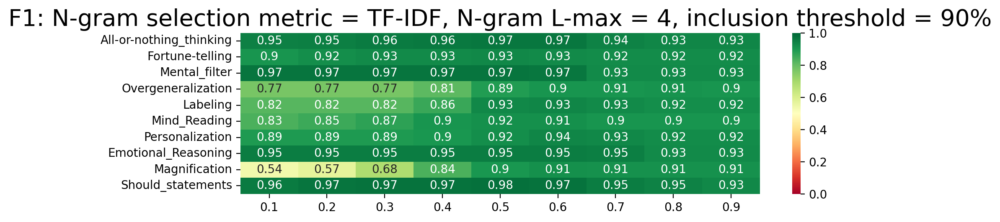

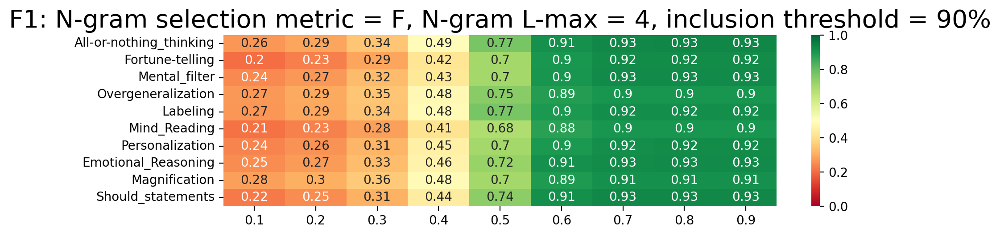

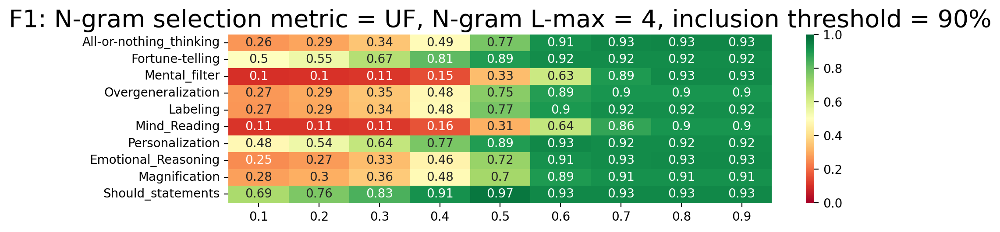

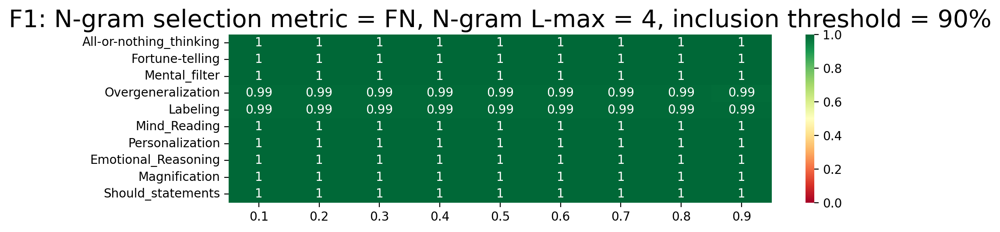

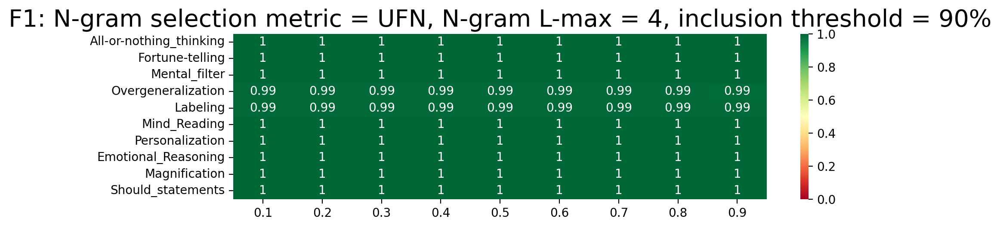

...

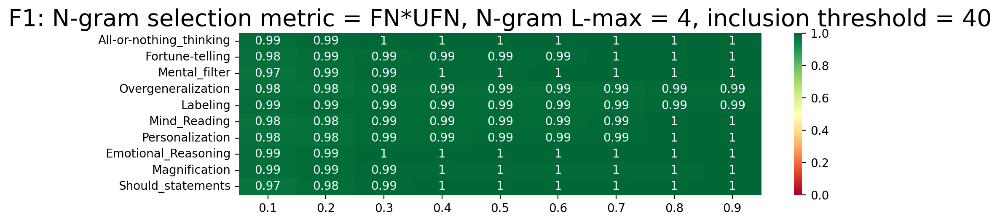

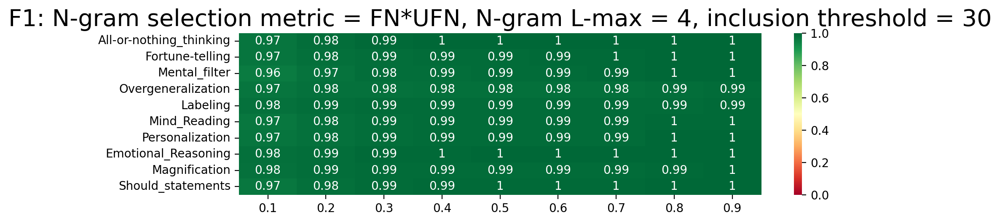

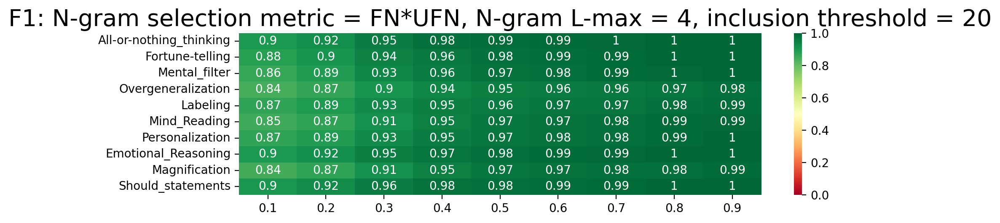

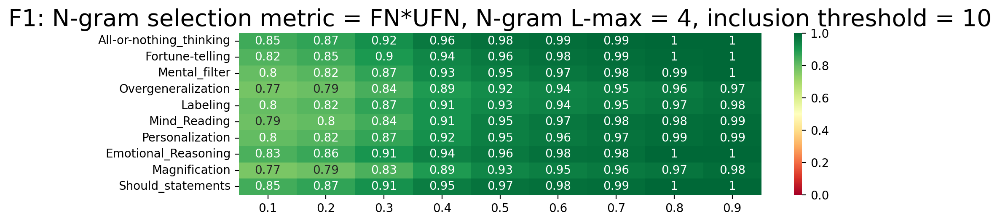

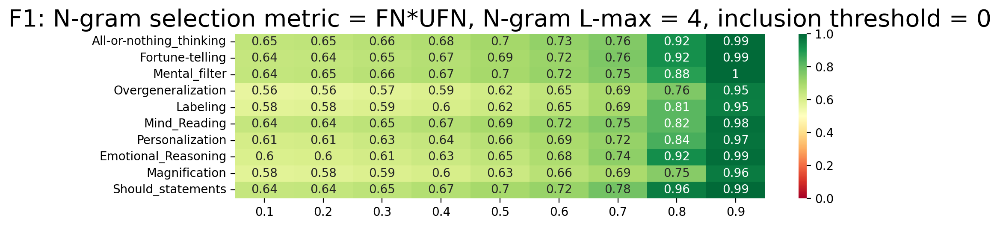

In [32]:
# 1) N-gram selection metric - threshold
for i, ngram_selection_metric in enumerate(ngram_selection_metrics):
    f1s = analyse_dataset(4, df, 'plot_results', ngram_selection_metric, 90)

    matrix_plot(all_metrics, thresholds, f1s, 1.0, 
                title = f'F1: N-gram selection metric = {ngram_selection_metric}, N-gram L-max = 4, inclusion threshold = 90%', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)


# 2) ngram_max - threshold
for i, ngram_max in enumerate(ngram_max_values):
    f1s = analyse_dataset(ngram_max, df, 'plot_results', ngram_selection_metric = 'FN*UFN', ngram_inclusion_threshold = 90)
    matrix_plot(all_metrics, thresholds, f1s, 1.0, 
                title = f'F1: N-gram selection metric = FN*UFN, N-gram L-max = {ngram_max}, inclusion threshold = 90%', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)

            
# 3) ngram_inclusion_threshold - threshold
for i, ngram_inclusion_threshold in enumerate(ngram_inclusion_thresholds):
    f1s = analyse_dataset(4, df, 'plot_results', 'FN*UFN', ngram_inclusion_threshold)
    matrix_plot(all_metrics, thresholds, f1s, 1.0, 
                title = f'F1: N-gram selection metric = FN*UFN, N-gram L-max = 4, inclusion threshold = {ngram_inclusion_threshold}', 
                vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 200, width = 10)

In [6]:
# Best model
f1s = analyse_dataset(4, df, 'print_results', 'FN*UFN', 90)


N-gram selection metric: FN*UFN
N-gram max length: 4
N-gram inclusion threshold: 90
	Threshold: 0.1 (distortion, precision, recall, F1 score, accuracy):
			All-or-nothing_thinking	1.0	1.0	1.0	1.0
			Fortune-telling	1.0	1.0	1.0	1.0
			Mental_filter	0.9969040247678018	1.0	0.9984496124031007	0.9997792494481236
			Overgeneralization	1.0	0.9362186788154897	0.9670588235294116	0.9938189845474613
			Labeling	1.0	0.9315068493150684	0.9645390070921985	0.9944812362030905
			Mind_Reading	0.9977272727272727	1.0	0.9988623435722412	0.9997792494481236
			Personalization	0.9859943977591037	0.9971671388101983	0.9915492957746479	0.9986754966887417
			Emotional_Reasoning	0.9910979228486647	1.0	0.9955290611028316	0.9993377483443708
			Magnification	1.0	0.9848101265822785	0.9923469387755103	0.9986754966887417
			Should_statements	1.0	1.0	1.0	1.0
	Threshold: 0.2 (distortion, precision, recall, F1 score, accuracy):
			All-or-nothing_thinking	1.0	1.0	1.0	1.0
			Fortune-telling	1.0	1.0	1.0	1.0
			Mental_filter